<h1 style='text-align: center;'> NLP With Hotel Review | BrainStation </h1>
<h3 style='text-align: center;'> Rafael Almazan </h3>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as stats

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)
sns.set_style('darkgrid')
%matplotlib inline


In [2]:
# read in hotel reviews csv
reviews = pd.read_csv('Hotel_Reviews.csv')
reviews.head()

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Russia,I am so angry that i made this post available...,397,1403,Only the park outside of the hotel was beauti...,11,7,2.9,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great ...,105,7,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
2,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,Australia,Rooms are nice but for elderly a bit difficul...,42,1403,Location was good and staff were ok It is cut...,21,9,7.1,"[' Leisure trip ', ' Family with young childre...",3 days,52.360576,4.915968
3,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,United Kingdom,My room was dirty and I was afraid to walk ba...,210,1403,Great location in nice surroundings the bar a...,26,1,3.8,"[' Leisure trip ', ' Solo traveler ', ' Duplex...",3 days,52.360576,4.915968
4,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/24/2017,7.7,Hotel Arena,New Zealand,You When I booked with your company on line y...,140,1403,Amazing location and building Romantic setting,8,3,6.7,"[' Leisure trip ', ' Couple ', ' Suite ', ' St...",10 days,52.360576,4.915968


In [3]:
# getting info
reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515738 entries, 0 to 515737
Data columns (total 17 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   Hotel_Address                               515738 non-null  object 
 1   Additional_Number_of_Scoring                515738 non-null  int64  
 2   Review_Date                                 515738 non-null  object 
 3   Average_Score                               515738 non-null  float64
 4   Hotel_Name                                  515738 non-null  object 
 5   Reviewer_Nationality                        515738 non-null  object 
 6   Negative_Review                             515738 non-null  object 
 7   Review_Total_Negative_Word_Counts           515738 non-null  int64  
 8   Total_Number_of_Reviews                     515738 non-null  int64  
 9   Positive_Review                             515738 non-null  object 
 

In [4]:
# getting description
reviews.describe()

,Additional_Number_of_Scoring,Average_Score,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,lat,lng
count,515738.000000,515738.000000,515738.000000,515738.000000,515738.000000,515738.000000,515738.000000,512470.000000,512470.000000
mean,498.081836,8.397487,18.539450,2743.743944,17.776458,7.166001,8.395077,49.442439,2.823803
std,500.538467,0.548048,29.690831,2317.464868,21.804185,11.040228,1.637856,3.466325,4.579425
min,1.000000,5.200000,0.000000,43.000000,0.000000,1.000000,2.500000,41.328376,-0.369758
25%,169.000000,8.100000,2.000000,1161.000000,5.000000,1.000000,7.500000,48.214662,-0.143372
50%,341.000000,8.400000,9.000000,2134.000000,11.000000,3.000000,8.800000,51.499981,0.010607
75%,660.000000,8.800000,23.000000,3613.000000,22.000000,8.000000,9.600000,51.516288,4.834443
max,2682.000000,9.800000,408.000000,16670.000000,395.000000,355.000000,10.000000,52.400181,16.429233


In [5]:
# getting the shape
reviews.shape

(515738, 17)

In [6]:
# checking for null values
reviews.isna().sum()


Hotel_Address                                    0
Additional_Number_of_Scoring                     0
Review_Date                                      0
Average_Score                                    0
Hotel_Name                                       0
Reviewer_Nationality                             0
Negative_Review                                  0
Review_Total_Negative_Word_Counts                0
Total_Number_of_Reviews                          0
Positive_Review                                  0
Review_Total_Positive_Word_Counts                0
Total_Number_of_Reviews_Reviewer_Has_Given       0
Reviewer_Score                                   0
Tags                                             0
days_since_review                                0
lat                                           3268
lng                                           3268
dtype: int64

## 1. Basic Exploratory Data Analysis

After taking a high-level look, the shape of the dataset is (515738, 17) meaning that there are 515738 rows of data and 17 columns or features in the dataset. Each row is a specific review of a specific hotel.

Of those 17 columns, our target column of interest is the Reviewer_Score dolumn. This column contains the review scores for each review on a scale from 1-10, with the mean score being about 8.4/10 These review scores are given in the form of decimals but for the purposes of our study, we will convert them into integers:

We also see that there are 3268 NULL values in the latitude and longitude columns. This may pose as a problem when building our models so we will keep this in mind. We also have the proportions of these lat/lng null values in regards to our target column of reviewer score so we may be able to drop these, if they are in the same as our global target variable proportions.

In [7]:
# rounding reviewer scores and converting them into integers
reviews['Reviewer_Score'] = [int(i) for i in round(reviews['Reviewer_Score'])]

# sanity check
reviews.head()

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Russia,I am so angry that i made this post available...,397,1403,Only the park outside of the hotel was beauti...,11,7,3,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great ...,105,7,8,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
2,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,Australia,Rooms are nice but for elderly a bit difficul...,42,1403,Location was good and staff were ok It is cut...,21,9,7,"[' Leisure trip ', ' Family with young childre...",3 days,52.360576,4.915968
3,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,United Kingdom,My room was dirty and I was afraid to walk ba...,210,1403,Great location in nice surroundings the bar a...,26,1,4,"[' Leisure trip ', ' Solo traveler ', ' Duplex...",3 days,52.360576,4.915968
4,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/24/2017,7.7,Hotel Arena,New Zealand,You When I booked with your company on line y...,140,1403,Amazing location and building Romantic setting,8,3,7,"[' Leisure trip ', ' Couple ', ' Suite ', ' St...",10 days,52.360576,4.915968


Now that we have our rounded review score values, we have a much more manageable target column for our data analysis. We have reduced the number of unique values and simplified our review scores to 10 unique values. This will also allow us to take a more categorical approach looking at the reviewer scores as more of a strict ordinal column instead of a continuous variable. In this way, we are able to get a better visualization of the distribution of these review scores, which we will now look at down below.

We predict that the distribution would be multimodal, with slightly higher counts towards higher values such as an 8 out of 10. This would be because we assume that most people will give a rating around that value. We don't expect perfect 10s all the time, but we also don't expect many reviewers to give reviews that are too low.

In [8]:
# checking proportions of target class
reviews.Reviewer_Score.value_counts(normalize=True)*100

Reviewer_Score
10    36.402980
8     21.358713
9     20.499168
7      8.548527
6      5.390334
5      4.689978
4      1.829611
3      0.854310
2      0.426379
Name: proportion, dtype: float64

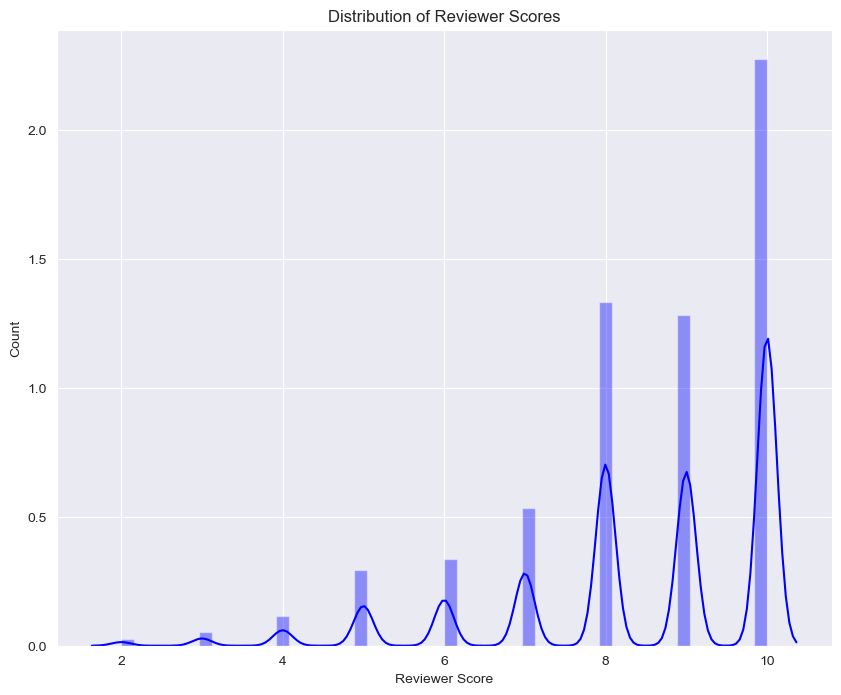

In [9]:
# checking distribution of target class
plt.figure(figsize=(10,8))
sns.distplot(reviews['Reviewer_Score'], color='blue')
plt.title('Distribution of Reviewer Scores')
plt.xlabel('Reviewer Score')
plt.ylabel('Count')
plt.show()

Here, we see that our predictions were right! We see that the distribution follows a left-skewed multimodal distribution with much more reviews lying in the higher 8-10 range.

This imbalance in distribution of our target column may pose as a problem when evaluating our models since it throws evaluating based on accuracy out the window. We will have to evaluate our model using a classification report and confusion matrix to asses performance or use feature engineering to convert our target column into a binary column to even out the proportions, setting a threshold for either 'Low' or 'High' scores.

We also see that the proportions of our whole dataset match the proportions of the null latitude and longitude values. With this information, we are able to confidently drop these rows with null latitude and longitude values since they will not affect our overall dataset too much. They are also only about 3000 rows in comparison to the 500000 rows in our whole dataset.

In [10]:
# double checking na proportions
reviews[(reviews.lat.isna() | (reviews.lng.isna()))].Reviewer_Score.value_counts(normalize=True)

Reviewer_Score
10    0.305386
8     0.249388
9     0.227356
7     0.086597
6     0.054468
5     0.046206
4     0.019584
3     0.006732
2     0.004284
Name: proportion, dtype: float64

In [11]:
# dropping the reviews that have null values
reviews = reviews.dropna()

# sanity check
reviews.isna().sum()

Hotel_Address                                 0
Additional_Number_of_Scoring                  0
Review_Date                                   0
Average_Score                                 0
Hotel_Name                                    0
Reviewer_Nationality                          0
Negative_Review                               0
Review_Total_Negative_Word_Counts             0
Total_Number_of_Reviews                       0
Positive_Review                               0
Review_Total_Positive_Word_Counts             0
Total_Number_of_Reviews_Reviewer_Has_Given    0
Reviewer_Score                                0
Tags                                          0
days_since_review                             0
lat                                           0
lng                                           0
dtype: int64

## 2. Feature Engineering

As we saw when we initially pulled in the dataset, there are 17 features. Of those 17, we can see that 9 of them are numeric columns while 8 are non-numeric.

**Numeric**:
1. Additional Number of Scoring
2. Average Score
3. Review total negative word counts
4. Review total positive word counts
5. Total number of reviews
6. Total number of reviews reviewer has given
7. Reviewer Score
8. Latitude
9. Longitude

**Non-numeric**:
1. Hotel address
2. Review Date
3. Hotel name
4. Reviewer Nationality
5. Negative Review
6. Positive Review
7. Tags
8. Days since review

Before we start on engineering these non-numeric features, we will first split our dataset since it is too big of a dataset to run. For this reason, we will only work with about 10% of the dataset, making sure to take a stratified sample of the data, taking the same proportions of our target variable (Reviewer_Score).

In [12]:
# checking the proportions of our target variable
reviews.Reviewer_Score.value_counts(normalize=True) * 100

Reviewer_Score
10    36.440377
8     21.335883
9     20.484906
7      8.547817
6      5.389974
5      4.690421
4      1.828790
3      0.855465
2      0.426366
Name: proportion, dtype: float64

In [13]:
# separating 20% of the dataset out 
hotel = reviews.groupby('Reviewer_Score', group_keys=False).apply(lambda x: x.sample(frac=0.1, random_state=42))\
.reset_index().drop('index', axis=1)

# sanity check to see if proportions are similar as above
hotel.Reviewer_Score.value_counts(normalize=True) * 100

Reviewer_Score
10    36.441869
8     21.336299
9     20.485501
7      8.547009
6      5.389689
5      4.691098
4      1.828435
3      0.854701
2      0.425399
Name: proportion, dtype: float64

In [14]:
hotel.head()

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng
0,163 Marsh Wall Docklands Tower Hamlets London ...,2682,8/23/2016,7.1,Britannia International Hotel Canary Wharf,United Kingdom,everything,2,9086,nothing,2,1,2,"[' Couple ', ' Standard Double Room ', ' Staye...",345 day,51.501910,-0.023221
1,19 25 Granville Place Marble Arch Westminster ...,234,6/5/2016,8.0,Radisson Blu Edwardian Sussex,Bahrain,The booking rules were very stringent No flex...,12,1295,The reservations desk staff were not cooperat...,11,8,2,"[' Leisure trip ', ' Solo traveler ']",424 day,51.514438,-0.155834
2,7 11 Queensberry Place Kensington and Chelsea ...,234,5/23/2017,6.9,Gainsborough Hotel,United Kingdom,We stopped at this hotel for just one night t...,335,1884,The location,3,1,2,"[' Leisure trip ', ' Couple ', ' Standard Doub...",72 days,51.494842,-0.177206
3,Pla a de Llevant s n Sant Mart 08019 Barcelona...,488,9/8/2015,8.2,Hotel SB Diagonal Zero Barcelona 4 Sup,Sweden,Personal attitude impossible to modify bookin...,49,4645,Nothing,2,12,2,"[' Leisure trip ', ' Solo traveler ', ' Deluxe...",695 day,41.411165,2.219201
4,Stephansplatz 12 01 Innere Stadt 1010 Vienna A...,81,11/27/2015,9.0,DO CO Hotel Vienna,Israel,No Negative,0,720,location service architecture,4,1,2,"[' Leisure trip ', ' Family with older childre...",615 day,48.208239,16.371572


We now have our smaller dataset. This is much easier to run on a laptop and still maintains the original proportions of our target variable. Our target has multiple classes and for the purposes of this study, we will narrow this down to a binary class. For any review score that is below 9, we will encode this as 'not good' or a 0 in our column. For every review with a score of 9 or 10 will be classified as 'good' or a 1 in our column. This is much simpler to interpret and understand. This will also only classify the top reviews as good and allows hotels to strive for a certain level of excellence. This will also balance our the ratio of our target feature and allow us to better evaluate our model using accuracy.

We will now transform this target feature

In [15]:
# transform target feature
hotel['Reviewer_Score'] = hotel['Reviewer_Score'].apply(lambda x: 0 if x < 9 else 1)

# sanity check
hotel['Reviewer_Score'].value_counts()

Reviewer_Score
1    29173
0    22073
Name: count, dtype: int64

We now have more equal proportions in our target feature and will now start engineering the rest of our features.

We also see that we have the review date in our original dataframe. We will now turn this column to a date-time column and extract the day, month, and year to add those as columns. We can leave these day, month, year columns as is since these are ordinal and have an order. One hot encoding these features will result in the loss of data.

Extracting these features will allow us to check for seasonality, looking at distributions of reviews throughout the whole year. This will also allow for insight into yearly trends and how customers behave throughout the years, as well as for tracking growth in customer service and whether the hotels are able to keep up with the fast-growing and fast-improving market and technologies out there, by looking at customer satisfaction.

In [16]:
# turn column into datetime
hotel['Review_Date'] = pd.to_datetime(hotel['Review_Date'])

# sanity check
type(hotel.Review_Date[0])

pandas._libs.tslibs.timestamps.Timestamp

In [17]:
# create a column for the year
hotel['Year'] = hotel['Review_Date'].dt.year

# create a column for the month
hotel['Month'] = hotel['Review_Date'].dt.month

# create a column for the day
hotel['Day'] = hotel['Review_Date'].dt.day

# sanity check
hotel.head()


,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng,Year,Month,Day
0,163 Marsh Wall Docklands Tower Hamlets London ...,2682,2016-08-23,7.1,Britannia International Hotel Canary Wharf,United Kingdom,everything,2,9086,nothing,2,1,0,"[' Couple ', ' Standard Double Room ', ' Staye...",345 day,51.501910,-0.023221,2016,8,23
1,19 25 Granville Place Marble Arch Westminster ...,234,2016-06-05,8.0,Radisson Blu Edwardian Sussex,Bahrain,The booking rules were very stringent No flex...,12,1295,The reservations desk staff were not cooperat...,11,8,0,"[' Leisure trip ', ' Solo traveler ']",424 day,51.514438,-0.155834,2016,6,5
2,7 11 Queensberry Place Kensington and Chelsea ...,234,2017-05-23,6.9,Gainsborough Hotel,United Kingdom,We stopped at this hotel for just one night t...,335,1884,The location,3,1,0,"[' Leisure trip ', ' Couple ', ' Standard Doub...",72 days,51.494842,-0.177206,2017,5,23
3,Pla a de Llevant s n Sant Mart 08019 Barcelona...,488,2015-09-08,8.2,Hotel SB Diagonal Zero Barcelona 4 Sup,Sweden,Personal attitude impossible to modify bookin...,49,4645,Nothing,2,12,0,"[' Leisure trip ', ' Solo traveler ', ' Deluxe...",695 day,41.411165,2.219201,2015,9,8
4,Stephansplatz 12 01 Innere Stadt 1010 Vienna A...,81,2015-11-27,9.0,DO CO Hotel Vienna,Israel,No Negative,0,720,location service architecture,4,1,0,"[' Leisure trip ', ' Family with older childre...",615 day,48.208239,16.371572,2015,11,27


Now that we have our new Year, Month, and Day columns, We can also work with our Review Date to extract whether or not a review was made on the weekday or the weekend. Since people are more likely to give reviews during or shortly after their stay at the hotel, looking into whether the review was given on the weekday or the weekend will give insight onto many things such as customer preferences during weekdays vs weekends as well as the difference in traffic within hotels, whether the weekdays or weekends see more traffic. Analysis on the weekdays and weekends will ultimately give a solid market review and provide insight on the whole landscape of the market.

We will create new columns for the day of the week and also whether it is a weekend or not.

The day of week column will start at on monday as 0 and go all the way to sunday as 6

In [18]:
# extracting the day of the week from Review date column
hotel['Day_of_Week'] = hotel['Review_Date'].dt.dayofweek

# creating new column for is_weekend
hotel['is_weekend'] = hotel['Day_of_Week'].apply(lambda x: 1 if x >= 5 else 0)

# sanity check
hotel.head()

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng,Year,Month,Day,Day_of_Week,is_weekend
0,163 Marsh Wall Docklands Tower Hamlets London ...,2682,2016-08-23,7.1,Britannia International Hotel Canary Wharf,United Kingdom,everything,2,9086,nothing,2,1,0,"[' Couple ', ' Standard Double Room ', ' Staye...",345 day,51.501910,-0.023221,2016,8,23,1,0
1,19 25 Granville Place Marble Arch Westminster ...,234,2016-06-05,8.0,Radisson Blu Edwardian Sussex,Bahrain,The booking rules were very stringent No flex...,12,1295,The reservations desk staff were not cooperat...,11,8,0,"[' Leisure trip ', ' Solo traveler ']",424 day,51.514438,-0.155834,2016,6,5,6,1
2,7 11 Queensberry Place Kensington and Chelsea ...,234,2017-05-23,6.9,Gainsborough Hotel,United Kingdom,We stopped at this hotel for just one night t...,335,1884,The location,3,1,0,"[' Leisure trip ', ' Couple ', ' Standard Doub...",72 days,51.494842,-0.177206,2017,5,23,1,0
3,Pla a de Llevant s n Sant Mart 08019 Barcelona...,488,2015-09-08,8.2,Hotel SB Diagonal Zero Barcelona 4 Sup,Sweden,Personal attitude impossible to modify bookin...,49,4645,Nothing,2,12,0,"[' Leisure trip ', ' Solo traveler ', ' Deluxe...",695 day,41.411165,2.219201,2015,9,8,1,0
4,Stephansplatz 12 01 Innere Stadt 1010 Vienna A...,81,2015-11-27,9.0,DO CO Hotel Vienna,Israel,No Negative,0,720,location service architecture,4,1,0,"[' Leisure trip ', ' Family with older childre...",615 day,48.208239,16.371572,2015,11,27,4,0


Now that we have extracted all we can form the review date, we will take a look at the "Days since review" column and turn it into a numerical feature. Since this is an ordinal column, we are able to leave it as simply the magnitude of days it has been since the review was posted. This will allow us to see how fresh and recent the review is and identify delays in responding to customer feedback. For example, if many customers have been complaining about a specific problem for a long time and it's consistent throughout the different days since review, we know that it has not yet been addressed and must be addressed.

In [19]:
import re

# use regex to extract only the integer
hotel['days_since_review'] = hotel['days_since_review'].apply(lambda x: int(re.findall(r'\d+', x)[0])).astype(int)


In [20]:
# sanity check
print(hotel.days_since_review)

print('\n')

# description
print(hotel.days_since_review.describe())

0        345
1        424
2         72
3        695
4        615
        ... 
51241     41
51242    298
51243    116
51244      7
51245    376
Name: days_since_review, Length: 51246, dtype: int32


count    51246.000000
mean       354.343637
std        208.621308
min          0.000000
25%        174.000000
50%        352.000000
75%        527.000000
max        730.000000
Name: days_since_review, dtype: float64


We have successfully converted our days_since_review column into an ordinal, numerical column. There is a range between 0 days and 730 days since the review was posted, with the average being about a year


For some of these non-numeric columns such as the Hotel name and reviewer nationality, we can turn them into numerical columns through one-hot encoding starting with the reviewer nationality.

In [21]:
# importing the One Hot Encoder
from sklearn.preprocessing import OneHotEncoder

In [22]:
# checking how many unique values there are in the reviewer nationality column
hotel.Reviewer_Nationality.nunique()

175

In [23]:
# creating dataframe of the reviewer nationality column
nationality = pd.DataFrame(hotel['Reviewer_Nationality'])

# instantiate the one hot encoder
ohe = OneHotEncoder()

# fit encoder to the nationality column and transform
nationality_encoded = ohe.fit_transform(nationality)
nationality_encoded

<51246x175 sparse matrix of type '<class 'numpy.float64'>'
	with 51246 stored elements in Compressed Sparse Row format>

In [24]:
# looking at the columns of the encoded sparse matrix
ohe.categories_

# nationality dataframe
nationality_encoded_df = pd.DataFrame(nationality_encoded.toarray(), columns=ohe.categories_, dtype=int)

display(nationality_encoded_df.head())

# checking to see if the number of rows is the same
print(nationality_encoded_df.shape)
print(hotel.shape)

,,Abkhazia Georgia,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua Barbuda,Argentina,Armenia,Aruba,Australia,Austria,Azerbaijan,Bahamas,Bahrain,Bangladesh,Barbados,Belarus,Belgium,Belize,Benin,Bermuda,Bhutan,Bosnia and Herzegovina,Botswana,Brazil,Brunei,Bulgaria,Cambodia,Canada,Cayman Islands,Chile,China,Colombia,Cook Islands,Costa Rica,Crimea,Croatia,Cura ao,Cyprus,Czech Republic,Democratic Republic of the Congo,Denmark,Dominica,Dominican Republic,East Timor,Ecuador,Egypt,Estonia,Ethiopia,Falkland Islands Malvinas,Fiji,Finland,France,French Polynesia,Gabon,Georgia,Germany,Ghana,Gibraltar,Greece,Guam,Guatemala,Guernsey,Honduras,Hong Kong,Hungary,Iceland,India,Indonesia,Iran,Iraq,Ireland,Isle of Man,Israel,Italy,Ivory Coast,Jamaica,Japan,Jersey,Jordan,Kazakhstan,Kenya,Kosovo,Kuwait,Kyrgyzstan,Laos,Latvia,Lebanon,Lesotho,Libya,Liechtenstein,Lithuania,Luxembourg,Macau,Macedonia,Malawi,Malaysia,Maldives,Mali,Malta,Martinique,Mauritius,Mexico,Moldova,Monaco,Mongolia,Montenegro,Morocco,Mozambique,Namibia,Netherlands,New Zealand,Nigeria,Norway,Oman,Pakistan,Palestinian Territory,Panama,Papua New Guinea,Paraguay,Peru,Philippines,Poland,Portugal,Puerto Rico,Qatar,Romania,Russia,Rwanda,Saint Barts,Saint Kitts and Nevis,Saint Lucia,Samoa,San Marino,Saudi Arabia,Senegal,Serbia,Seychelles,Singapore,Slovakia,Slovenia,South Africa,South Korea,Spain,Sri Lanka,Sudan,Suriname,Swaziland,Sweden,Switzerland,Syria,Taiwan,Tanzania,Thailand,Trinidad and Tobago,Tunisia,Turkey,Turks Caicos Islands,U S Virgin Islands,Uganda,Ukraine,United Arab Emirates,United Kingdom,United States Minor Outlying Islands,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela,Vietnam,Yemen,Zambia,Zimbabwe
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


(51246, 175)
(51246, 22)


Above is the a dataframe of our transformed Reviewer Nationality column. We also see that the amount of rows is also the same for both the new dataframe and our original reviews dataframe. Here, we see that there is actually a blank value in our reviewer nationality column. We will rename this to be unknown.

In [25]:
# checking the name of the column
nationality_encoded_df.columns[0]

(' ',)

In [26]:
#rename to be unknown
nationality_encoded_df.rename(columns={' ': 'Unknown'}, inplace=True)

#sanity check
nationality_encoded_df.head()

,Unknown,Abkhazia Georgia,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua Barbuda,Argentina,Armenia,Aruba,Australia,Austria,Azerbaijan,Bahamas,Bahrain,Bangladesh,Barbados,Belarus,Belgium,Belize,Benin,Bermuda,Bhutan,Bosnia and Herzegovina,Botswana,Brazil,Brunei,Bulgaria,Cambodia,Canada,Cayman Islands,Chile,China,Colombia,Cook Islands,Costa Rica,Crimea,Croatia,Cura ao,Cyprus,Czech Republic,Democratic Republic of the Congo,Denmark,Dominica,Dominican Republic,East Timor,Ecuador,Egypt,Estonia,Ethiopia,Falkland Islands Malvinas,Fiji,Finland,France,French Polynesia,Gabon,Georgia,Germany,Ghana,Gibraltar,Greece,Guam,Guatemala,Guernsey,Honduras,Hong Kong,Hungary,Iceland,India,Indonesia,Iran,Iraq,Ireland,Isle of Man,Israel,Italy,Ivory Coast,Jamaica,Japan,Jersey,Jordan,Kazakhstan,Kenya,Kosovo,Kuwait,Kyrgyzstan,Laos,Latvia,Lebanon,Lesotho,Libya,Liechtenstein,Lithuania,Luxembourg,Macau,Macedonia,Malawi,Malaysia,Maldives,Mali,Malta,Martinique,Mauritius,Mexico,Moldova,Monaco,Mongolia,Montenegro,Morocco,Mozambique,Namibia,Netherlands,New Zealand,Nigeria,Norway,Oman,Pakistan,Palestinian Territory,Panama,Papua New Guinea,Paraguay,Peru,Philippines,Poland,Portugal,Puerto Rico,Qatar,Romania,Russia,Rwanda,Saint Barts,Saint Kitts and Nevis,Saint Lucia,Samoa,San Marino,Saudi Arabia,Senegal,Serbia,Seychelles,Singapore,Slovakia,Slovenia,South Africa,South Korea,Spain,Sri Lanka,Sudan,Suriname,Swaziland,Sweden,Switzerland,Syria,Taiwan,Tanzania,Thailand,Trinidad and Tobago,Tunisia,Turkey,Turks Caicos Islands,U S Virgin Islands,Uganda,Ukraine,United Arab Emirates,United Kingdom,United States Minor Outlying Islands,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela,Vietnam,Yemen,Zambia,Zimbabwe
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


Now that we have our new nationality dataframe, we will go ahead and split up some of the other non-numerical columns, starting with the Hotel Name. We will then concatinate all these dataframes together to create our final dataframe 

In [27]:
# checking column counts
hotel.Hotel_Name.nunique()

1460

In [28]:
# creating dataframe of the reviewer nationality column
names = pd.DataFrame(hotel['Hotel_Name'])

# instantiate the one hot encoder
ohe = OneHotEncoder()

# fit encoder to the nationality column and transform
names_encoded = ohe.fit_transform(names)

# nationality dataframe
names_encoded_df = pd.DataFrame(names_encoded.toarray(), columns=ohe.categories_, dtype=int)

display(names_encoded_df.head())

# checking to see if the number of rows is the same
print(names_encoded_df.shape)
print(hotel.shape)

,11 Cadogan Gardens,1K Hotel,25hours Hotel beim MuseumsQuartier,41,45 Park Lane Dorchester Collection,88 Studios,9Hotel Republique,A La Villa Madame,ABaC Restaurant Hotel Barcelona GL Monumento,AC Hotel Barcelona Forum a Marriott Lifestyle Hotel,AC Hotel Diagonal L Illa a Marriott Lifestyle Hotel,AC Hotel Irla a Marriott Lifestyle Hotel,AC Hotel Milano a Marriott Lifestyle Hotel,AC Hotel Paris Porte Maillot by Marriott,AC Hotel Sants a Marriott Lifestyle Hotel,AC Hotel Victoria Suites a Marriott Lifestyle Hotel,ADI Doria Grand Hotel,ADI Hotel Poliziano Fiera,ARCOTEL Kaiserwasser Superior,ARCOTEL Wimberger,AZIMUT Hotel Vienna,Abba Garden,Abba Sants,Acad mie H tel Saint Germain,Acca Palace,Ace Hotel London Shoreditch,Acevi Villarroel,Acta Atrium Palace,Acta CITY47,Admiral Hotel,Adria Boutique Hotel,Ako Suites Hotel,Albus Hotel Amsterdam City Centre,Alexandra Barcelona A DoubleTree by Hilton,Alma Barcelona GL,Alma Boutique Hotel,Aloft London Excel,Am Spiegeln,Amadi Panorama Hotel,Amadi Park Hotel,Amarante Beau Manoir,Amarante Champs Elys es,Amba Hotel Charing Cross,Amba Hotel Marble Arch,Ambassade Hotel,Ambassadors Bloomsbury,Amp re,Amsterdam Canal Residence,Amsterdam Marriott Hotel,Andaz Amsterdam Prinsengracht A Hyatt Hotel,Andaz London Liverpool Street,Andreola Central Hotel,Antares Hotel Accademia,Antares Hotel Rubens,Antica Locanda Dei Mercanti,Aparthotel Adagio Vienna City,Aparthotel Arai 4 Superior,Aparthotel Atenea Barcelona,Aparthotel Mariano Cubi Barcelona,Apex City Of London Hotel,Apex London Wall Hotel,Apex Temple Court Hotel,Apollo Hotel Amsterdam,Apollofirst Boutique Hotel,Appartement Hotel an der Riemergasse,Arbor City,Arbor Hyde Park,Arenas Atiram Hotels,Arion Cityhotel Vienna und Appartements,Arioso,Armani Hotel Milano,Art Hotel Navigli,Arthotel ANA Boutique Six,Arthotel ANA Prime,Arthotel ANA Westbahn,Artus Hotel by MH,Ashburn Hotel,Atahotel Contessa Jolanda,Atahotel Linea Uno,Atala Champs Elys es,Atlantis Hotel Vienna,Attica 21 Barcelona Mar,Au Manoir Saint Germain,Austria Trend Hotel Ananas Wien,Austria Trend Hotel Anatol Wien,Austria Trend Hotel Astoria Wien,Austria Trend Hotel Bosei Wien,Austria Trend Hotel Doppio Wien,Austria Trend Hotel Europa Wien,Austria Trend Hotel Lassalle Wien,Austria Trend Hotel Park Royal Palace Vienna,Austria Trend Hotel Rathauspark Wien,Austria Trend Hotel Savoyen Vienna,Austria Trend Parkhotel Sch nbrunn Wien,Auteuil Tour Eiffel,Avenida Palace,Avo Hotel,Axel Hotel Barcelona Urban Spa Adults Only,Ayre Hotel Caspe,Ayre Hotel Gran V a,Ayre Hotel Rosell n,B Montmartre,BEST WESTERN Maitrise Hotel Maida Vale,BEST WESTERN PLUS Amedia Wien,Baglioni Hotel Carlton The Leading Hotels of the World,Baglioni Hotel London The Leading Hotels of the World,Balmoral Champs Elys es,Banke H tel,Banks Mansion All Inclusive Hotel,Barcel Milan,Barcel Raval,Barcel Sants,Barcelona Hotel Colonial,Barcelona Princess,Bassano,Batty Langley s,Bcn Urban Hotels Gran Rosellon,Belfast,Bentley London,Bermondsey Square Hotel A Bespoke Hotel,Best Western Allegro Nation,Best Western Amiral Hotel,Best Western Antares Hotel Concorde,Best Western Atlantic Hotel,Best Western Aulivia Op ra,Best Western Blue Tower Hotel,Best Western Bretagne Montparnasse,Best Western Delphi Hotel,Best Western Ducs de Bourgogne,Best Western Hotel Ascot,Best Western Hotel Astoria,Best Western Hotel City,Best Western Hotel Major,Best Western Hotel Mirage,Best Western Hotel Montmartre Sacr Coeur,Best Western Hotel Pension Arenberg Wien Zentrum,Best Western Hotel St George,Best Western Le 18 Paris,Best Western Le Jardin de Cluny,Best Western Madison Hotel,Best Western Maitrise Hotel Edgware Road,Best Western Mercedes Arc de Triomphe,Best Western Mornington Hotel Hyde Park,Best Western Nouvel Orl ans Montparnasse,Best Western Op ra Batignolles,Best Western PLUS Epping Forest,Best Western Palm Hotel,Best Western Paris Gare Saint Lazare,Best Western Plus 61 Paris Nation Hotel,Best Western Plus Elys e Secret,Best Western Plus Hotel Blue Square,Best 

(51246, 1460)
(51246, 22)


Now we have a dataframe containing all the hotel names and a dataframe containing all the nationalities. We will concatenate these later once we have everything together. 

We will first look at the Tags column and extract new numerical columns from there.

In [29]:
import ast

# evaluates this string and makes it a list of strings
hotel['Tags'] = hotel['Tags'].apply(ast.literal_eval)

In [30]:
from sklearn.preprocessing import MultiLabelBinarizer

# instantiate
mlb = MultiLabelBinarizer()

# create dataframe of transformed hotel tags column. MLB used since tags values are iterable and contain multiple labels
tags_df = pd.DataFrame(mlb.fit_transform(hotel['Tags']), columns=mlb.classes_)

#sanity check
display(tags_df.head())
print(tags_df.shape)
print(hotel.shape)

1 King Bed Guest Room    2 Adjacent Non Communicating Rooms    
0                        0                                     0  \
1                        0                                     0   
2                        0                                     0   
3                        0                                     0   
4                        0                                     0   

    2 Adjacent Rooms    2 Adjacent Superior Rooms    
0                   0                            0  \
1                   0                            0   
2                   0                            0   
3                   0                            0   
4                   0                            0   

    2 Connecting Deluxe Rooms with VIP Service for Kids    
0                                                  0      \
1                                                  0       
2                                                  0       
3                                                  0       
4                                                  0       

    2 Connecting Rooms 4 people    2 Connecting Rooms 5 Adults    
0                              0                              0  \
1                              0                              0   
2                              0                              0   
3                              0                              0   
4                              0                              0   

    2 Connecting Rooms 5 people    2 Twin Beds Guest Room    
0                              0                         0  \
1                              0                         0   
2                              0                         0   
3                              0                         0   
4                              0                         0   

    2 double Connecting Rooms    2 rooms    3 Connecting Rooms    3 rooms    
0                            0          0                     0          0  \
1                            0          0                     0          0   
2                            0          0                     0          0   
3                            0          0                     0          0   
4                            0          0                     0          0   

    4 Person Suite    4 rooms    5 rooms    Accessible Queen Guest Room    
0                 0          0          0                              0  \
1                 0          0          0                              0   
2                 0          0          0                              0   
3                 0          0          0                              0   
4                 0          0          0                              0   

    Accessible Twin Guest Room    Accessible Twin Room    
0                             0                       0  \
1                             0                       0   
2                             0                       0   
3                             0                       0   
4                             0                       0   

    Adjacent Double Rooms    Adjacent Rooms    Aldwych Double Twin Room    
0                        0                 0                           0  \
1                        0                 0                           0   
2                        0                 0                           0   
3                        0                 0                           0   
4                        0                 0                           0   

    Ambassador Suite    Ambassadors Room    Amiral Single Room    
0                   0                   0                     0  \
1                   0                   0                     0   
2                   0                   0                     0   
3                   0                   0                     0   
4                   0                   0                   

(51246, 1626)
(51246, 22)


Now, we have our Tags colums dataframe and see that it contains the same amount of rows as our original hotel column. Extracting these tags is crucial since we are able to see which reviews have which tags. We are also able to see the interactions between these tags and whether one tag and another interacting will have an effect on certain other features. 

We will now work on extracting features from the hotel address. The Hotel address seems to end in the city followed by the country. (ie. Paris France) except for the Hotels which are in the United Kingdom. We will assume that all these hotels in the UK are in London and define a function that will help us create our new dataframe.

In [31]:
# extracting the last two words
' '.join(hotel['Hotel_Address'][0].split()[-2:])

'United Kingdom'

In [32]:
def city_country(df, address_col):
    '''
    inputs:
    df -> main dataframe to pass in
    address_col -> the address column of the dataframe

    output:
    encoded_df -> new dataframe with cities and countries as columns
    '''
    # taking the last two words
    last_two = df[address_col].str.split().str[-2:]

    # bool based on if the last two are the uk
    is_uk = last_two.apply(lambda x: ' '.join(x) == 'United Kingdom')

    # dataframe with city/country
    new_df = pd.DataFrame({
        'city': np.where(is_uk, 'London', last_two.str[0]),
        'country': np.where(is_uk, 'United Kingdom', last_two.str[1])
    })

    # instantiate the one hot encoder
    ohe = OneHotEncoder()

    # fit encoder to the nationality column and transform
    encoded = ohe.fit_transform(new_df[['city','country']])

    # nationality dataframe
    encoded_df = pd.DataFrame(encoded.toarray(), columns=ohe.get_feature_names_out(['city','country']), dtype=int)
    

    return encoded_df

cities_countries = city_country(hotel, 'Hotel_Address')

In [33]:
# sanity check
cities_countries.head()
cities_countries.sum()

city_Amsterdam             5671
city_Barcelona             6008
city_London               26425
city_Milan                 3641
city_Paris                 5829
city_Vienna                3672
country_Austria            3672
country_France             5829
country_Italy              3641
country_Netherlands        5671
country_Spain              6008
country_United Kingdom    26425
dtype: int64

In [34]:
# checking shapes
print(hotel.shape)
print(cities_countries.shape)

(51246, 22)
(51246, 12)


We have created a function that does exactly what we needed. We have extracted the cities and countries from the hotel address column and separated them into their own columns. Below is a list of the cities and countries:

1. Amsterdam, Netherlands
2. Barcelona, Spain
3. London, United Kingdom
4. Milan, Italy
5. Paris, France
6. Vienna, Austria

We also see that there are the same amount of rows in our new dataframe and our original dataframe, giving us confidence that we have not lost any information.

We have transformed the Hotel Address, Review Date, Hotel Name, Reviewer Nationality, Tags, and Days since the review. We will now concatenate all these features together and drop these original columns, leaving the positive and negative reviews as our only non-numeric columns

In [35]:
# showing the head of all our separate dataframes
full_reviews = pd.concat([hotel, names_encoded_df, nationality_encoded_df, tags_df, cities_countries], axis=1)

full_reviews.head()

Hotel_Address   
0  163 Marsh Wall Docklands Tower Hamlets London ...  \
1  19 25 Granville Place Marble Arch Westminster ...   
2  7 11 Queensberry Place Kensington and Chelsea ...   
3  Pla a de Llevant s n Sant Mart 08019 Barcelona...   
4  Stephansplatz 12 01 Innere Stadt 1010 Vienna A...   

   Additional_Number_of_Scoring Review_Date  Average_Score   
0                          2682  2016-08-23            7.1  \
1                           234  2016-06-05            8.0   
2                           234  2017-05-23            6.9   
3                           488  2015-09-08            8.2   
4                            81  2015-11-27            9.0   

                                   Hotel_Name Reviewer_Nationality   
0  Britannia International Hotel Canary Wharf      United Kingdom   \
1               Radisson Blu Edwardian Sussex             Bahrain    
2                          Gainsborough Hotel      United Kingdom    
3      Hotel SB Diagonal Zero Barcelona 4 Sup              Sweden    
4                          DO CO Hotel Vienna              Israel    

                                     Negative_Review   
0                                         everything  \
1   The booking rules were very stringent No flex...   
2   We stopped at this hotel for just one night t...   
3   Personal attitude impossible to modify bookin...   
4                                        No Negative   

   Review_Total_Negative_Word_Counts  Total_Number_of_Reviews   
0                                  2                     9086  \
1                                 12                     1295   
2                                335                     1884   
3                                 49                     4645   
4                                  0                      720   

                                     Positive_Review   
0                                            nothing  \
1   The reservations desk staff were not cooperat...   
2                                       The location   
3                                            Nothing   
4                      location service architecture   

   Review_Total_Positive_Word_Counts   
0                                  2  \
1                                 11   
2                                  3   
3                                  2   
4                                  4   

   Total_Number_of_Reviews_Reviewer_Has_Given  Reviewer_Score   
0                                           1               0  \
1                                           8               0   
2                                           1               0   
3                                          12               0   
4                                           1               0   

                                                Tags  days_since_review   
0  [ Couple ,  Standard Double Room ,  Stayed 1 n...                345  \
1                  [ Leisure trip ,  Solo traveler ]                424   
2  [ Leisure trip ,  Couple ,  Standard Double Ro...                 72   
3  [ Leisure trip ,  Solo traveler ,  Deluxe Doub...                695   
4  [ Leisure trip ,  Family with older children ,...                615   

         lat        lng  Year  Month  Day  Day_of_Week  is_weekend   
0  51.501910  -0.023221  2016      8   23            1           0  \
1  51.514438  -0.155834  2016      6    5            6           1   
2  51.494842  -0.177206  2017      5   23            1           0   
3  41.411165   2.219201  2015      9    8            1           0   
4  48.208239  16.371572  2015     11   27            4           0   

   (11 Cadogan Gardens,)  (1K Hotel,)  (25hours Hotel beim MuseumsQuartier,)   
0                      0            0                                      0  \
1                      0            0                                      0   
2                      0            0                                      0   
3                  

Here, we have concatenated our data frames along the columns axis. We will now drop some of these non-numeric columns, only leaving the positive and negative reviews, which we will apply text based vectorization tools afterwards.

In [36]:
# dropping these features
full_reviews = full_reviews.drop(['Hotel_Address', 'Review_Date', 'Hotel_Name', 'Reviewer_Nationality', 'Tags'], axis=1)

#sanity check
full_reviews.head()

Additional_Number_of_Scoring  Average_Score   
0                          2682            7.1  \
1                           234            8.0   
2                           234            6.9   
3                           488            8.2   
4                            81            9.0   

                                     Negative_Review   
0                                         everything  \
1   The booking rules were very stringent No flex...   
2   We stopped at this hotel for just one night t...   
3   Personal attitude impossible to modify bookin...   
4                                        No Negative   

   Review_Total_Negative_Word_Counts  Total_Number_of_Reviews   
0                                  2                     9086  \
1                                 12                     1295   
2                                335                     1884   
3                                 49                     4645   
4                                  0                      720   

                                     Positive_Review   
0                                            nothing  \
1   The reservations desk staff were not cooperat...   
2                                       The location   
3                                            Nothing   
4                      location service architecture   

   Review_Total_Positive_Word_Counts   
0                                  2  \
1                                 11   
2                                  3   
3                                  2   
4                                  4   

   Total_Number_of_Reviews_Reviewer_Has_Given  Reviewer_Score   
0                                           1               0  \
1                                           8               0   
2                                           1               0   
3                                          12               0   
4                                           1               0   

   days_since_review        lat        lng  Year  Month  Day  Day_of_Week   
0                345  51.501910  -0.023221  2016      8   23            1  \
1                424  51.514438  -0.155834  2016      6    5            6   
2                 72  51.494842  -0.177206  2017      5   23            1   
3                695  41.411165   2.219201  2015      9    8            1   
4                615  48.208239  16.371572  2015     11   27            4   

   is_weekend  (11 Cadogan Gardens,)  (1K Hotel,)   
0           0                      0            0  \
1           1                      0            0   
2           0                      0            0   
3           0                      0            0   
4           0                      0            0   

   (25hours Hotel beim MuseumsQuartier,)  (41,)   
0                                      0      0  \
1                                      0      0   
2                                      0      0   
3                                      0      0   
4                                      0      0   

   (45 Park Lane Dorchester Collection,)  (88 Studios,)  (9Hotel Republique,)   
0                                      0              0                     0  \
1                                      0              0                     0   
2                                      0              0                     0   
3                                      0              0                     0   
4                                      0              0                     0   

   (A La Villa Madame,)  (ABaC Restaurant Hotel Barcelona GL Monumento,)   
0                     0                                                0  \
1                     0                                                0   
2                     0                                                0   
3                     0                                                0   
4                     0                          

In [37]:
# checking for all non-numeric columns
full_reviews.select_dtypes(include=['object']).columns

Index(['Negative_Review', 'Positive_Review'], dtype='object')

After dropping these columns, we can see that the only non-numeric columns remaining in our dataframe are the Positive and Negative review columns. We will vectorize these columns after we split our data into a train and test set.

In [38]:
from sklearn.model_selection import train_test_split

# Assigning our independent and dependent variables
X = full_reviews.drop('Reviewer_Score', axis=1)
y = full_reviews['Reviewer_Score']

# splitting our data to a train and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)



In [39]:
X_train.shape

(35872, 3289)

Here, we have just separated our data into the train and test sets, as well as separated the target variable from our independent variables. We will now go ahead and vectorize our positive and negative reviews, looking at different min_df values.

We will first separate out the review columns from the rest of the data

In [40]:
# extracting the positive reviews
X_train_pos = X_train['Positive_Review']
X_test_pos = X_test['Positive_Review']

# extracting the negative reviews
X_train_neg = X_train['Negative_Review']
X_test_neg = X_test['Negative_Review']

## 3. NLP - Count Vectorizer

After extracting these, we will go ahead and vectorize these columns one at a time, starting with the positive reviews. Since we are not assessing similarity or uniqueness between reviews, We will use the CountVectorizer since it may be beneficial to emphasize words based on how frequent they show up throughout each review. We are then able to see which words are important for our classifications, seeing which words more frequently show up in the positive or negative reviews. 

Since we have a very large dataset, we will play with the min_df value. This would mean that for us to create a new column for that specific word, it must show up at least X times. This will ensure us that we will have only the most important words to our whole corpus in our vectorized data. This will greatly improve computational power since we wouldn't have to have over 100,000 columns, and only have the most important words be tokenized. We will also remove stop words, which do not tell us any information

In order to pick the best min_df value, we will perform a grid search on different min_df values for a simple, logistic regression model to predict our y_train. We will use the best min_df value that will result in the highest performance for the logistic regression. Everything else will remain constant except for the min_df value in our CountVectorizer

In [41]:
#import
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

# creating a list of estimators as a placeholder
estimators = [
    ('vectorizer', CountVectorizer()),
    ('model', LogisticRegression)
]

# instantiating pipeline
my_pipe = Pipeline(estimators)

# creating grid search parameters, only having min_df change
grid_param = [
    {
        'vectorizer__min_df': range(1,20),
        'model': [LogisticRegression()]
    }
]

# instantiate grid search
grid = GridSearchCV(my_pipe, grid_param, cv=5)

Now that we have our grid searcher, we can feed our positive reviews train set and see which parameter is best


In [42]:
# fit grid search to positive training set
fittedgrid = grid.fit(X_train_pos, y_train)

# output the best min_df value
fittedgrid.best_params_

{'model': LogisticRegression(), 'vectorizer__min_df': 16}

We see that a min_df value of 16 will give us highest performance in a base logistic regression model. This means that only including words that show up in 16 or more reviews gives us the best performance in a base logistic regression model.

(35872, 3345)


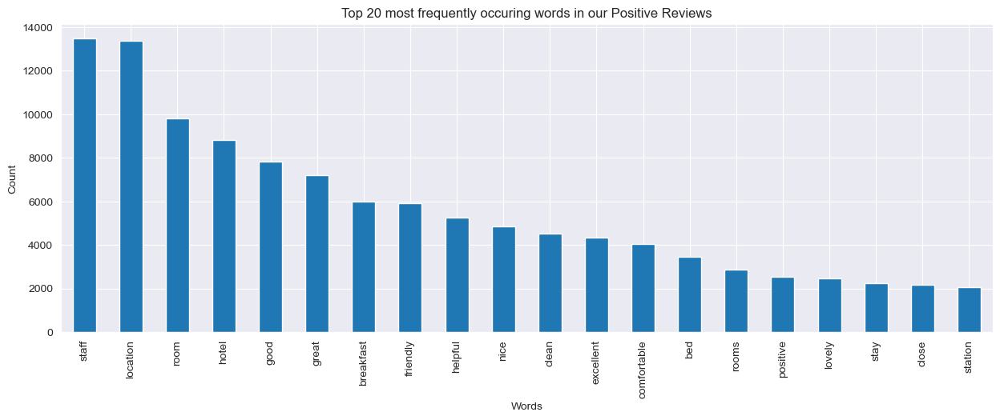

pos_00  pos_02  pos_10  pos_10 10  pos_10 15  pos_10 min  pos_10 mins   
0           0       0       0          0          0           0            0  \
1           0       0       0          0          0           0            0   
2           0       0       0          0          0           0            0   
3           0       0       0          0          0           0            0   
4           0       0       0          0          0           0            0   
...       ...     ...     ...        ...        ...         ...          ...   
35867       0       0       0          0          0           0            0   
35868       0       0       0          0          0           0            0   
35869       0       0       0          0          0           0            0   
35870       0       0       0          0          0           0            0   
35871       0       0       0          0          0           0            0   

       pos_10 minute  pos_10 minutes  pos_100  pos_100m  pos_11  pos_12   
0                  0               0        0         0       0       0  \
1                  0               0        0         0       0       0   
2                  0               0        0         0       0       0   
3                  0               0        0         0       0       0   
4                  0               0        0         0       0       0   
...              ...             ...      ...       ...     ...     ...   
35867              0               0        0         0       0       0   
35868              0               0        0         0       0       0   
35869              0               0        0         0       0       0   
35870              0               0        0         0       0       0   
35871              0               0        0         0       0       0   

       pos_14  pos_15  pos_15 20  pos_15 min  pos_15 mins  pos_15 minute   
0           0       0          0           0            0              0  \
1           0       0          0           0            0              0   
2           0       0          0           0            0              0   
3           0       0          0           0            0              0   
4           0       0          0           0            0              0   
...       ...     ...        ...         ...          ...            ...   
35867       0       0          0           0            0              0   
35868       0       0          0           0            0              0   
35869       0       0          0           0            0              0   
35870       0       0          0           0            0              0   
35871       0       0          0           0            0              0   

       pos_15 minutes  pos_1st  pos_20  pos_20 min  pos_20 mins   
0                   0        0       0           0            0  \
1                   0        0       0           0            0   
2                   0        0       0           0            0   
3                   0        0       0           0            0   
4                   0        0       0           0            0   
...               ...      ...     ...         ...          ...   
35867               0        0       0           0            0   
35868               0        0       0           0            0   
35869               0        0       0           0            0   
35870               0        0       0           0            0   
35871               0        0       0           0            0   

       pos_20 minutes  pos_24  pos_24 hours  pos_25  pos_2nd  pos_30  pos_3rd   
0                   0       0             0       0        0       0        0  \
1                   0       0             0       0        0       0        0   
2                   0       0             0       0        0       0        0   
3                   0       0             0       0        0       0        0   
4                   0 

In [43]:
# instantiate the vectorizer with min_df of 16
bagofwords = CountVectorizer(min_df=16,
                             stop_words='english',
                             ngram_range=(1,2))

# fit the vectorizer on our train data and transform both train and test
bagofwords.fit(X_train_pos)
X_train_pos_transformed = bagofwords.transform(X_train_pos)
X_test_pos_transformed = bagofwords.transform(X_test_pos)

# create dataframes for train and test
X_train_pos_transformed_df = pd.DataFrame(X_train_pos_transformed.toarray(), columns=bagofwords.get_feature_names_out()).add_prefix('pos_')
X_test_pos_transformed_df = pd.DataFrame(X_test_pos_transformed.toarray(), columns=bagofwords.get_feature_names_out()).add_prefix('pos_')


print(X_train_pos_transformed.shape)

# take the counts of each word
count = pd.DataFrame({"counts": X_train_pos_transformed.toarray().sum(axis=0)}, index=bagofwords.get_feature_names_out()).sort_values("counts", ascending=False)

# plot the counts of each word
count.head(20).plot(kind="bar", figsize=(15, 5), legend=False)
plt.title('Top 20 most frequently occuring words in our Positive Reviews')
plt.xlabel('Words')
plt.ylabel('Count')
plt.show()

# checking new dataframe
display(X_train_pos_transformed_df)

Now, we have gone through the process of using a CountVectorizer on our positive reviews column and have fit it on our training data with a min_df of 19 and eliminating stop words.

We also decided to take both unigrams and bigrams. Including Bigrams that have occured in more than 19 reviews is important information because it may provide more context to what the reviews are actually saying. For example, we may see the bigram "amazing breakfast" have a strong presence in the reviews and thus we would know that breakfast is an important aspect of customers giving a higher rating.

Just a first look at our positive review data, we can see that staff and location are very frequently used words in these positive reviews. This may mean that the staff and location at the hotels are very important to customer satisfaction. We also see very positive words such as 'great', 'friendly', and 'helpful'

Next, we will go through the same transformation with our negative reviews column, starting with checking for the best min_df value for a base logistic regression.

In [44]:
# fitting grid search to negative reviews training set
fittedgrid = grid.fit(X_train_neg, y_train)

# outputting the best min_df value
fittedgrid.best_params_

{'model': LogisticRegression(), 'vectorizer__min_df': 7}

Fitting our grid search to our negative reviews, we see that the best min_df to use in a base logistic regression would be a min_df of 7 in our CountVectorizer. This means that only words occuring in 7 or more reviews works performs the best for our model. We will go ahead and usethis for our CountVectorizer function

(35872, 6961)


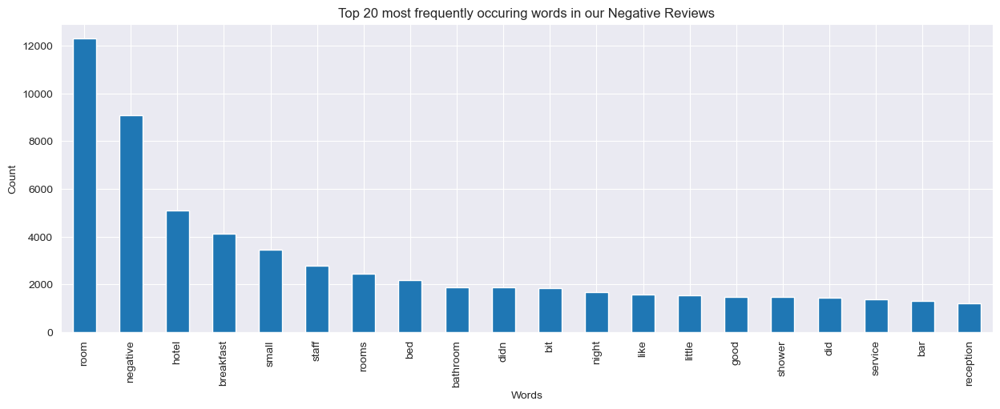

,neg_00,neg_00 morning,neg_00 pm,neg_00am,neg_00pm,neg_02,neg_10,neg_10 00,neg_10 10,neg_10 15,neg_10 30,neg_10 euro,neg_10 euros,neg_10 min,neg_10 mins,neg_10 minute,neg_10 minutes,neg_10 pm,neg_100,neg_10am,neg_10pm,neg_11,neg_11 00,neg_11 30,neg_11 30pm,neg_11am,neg_11pm,neg_12,neg_12 service,neg_120,neg_12pm,neg_13,neg_14,neg_14 00,neg_15,neg_15 00,neg_15 20,neg_15 euro,neg_15 euros,neg_15 min,neg_15 mins,neg_15 minute,neg_15 minutes,neg_150,neg_15mins,neg_16,neg_17,neg_18,neg_18 euros,neg_19,neg_19 euros,neg_1am,neg_1pm,neg_1st,neg_1st floor,neg_20,neg_20 30,neg_20 euros,neg_20 min,neg_20 mins,neg_20 minutes,neg_200,neg_200 night,neg_2015,neg_2017,neg_21,neg_21st,neg_22,neg_23,neg_24,neg_24 hour,neg_24 hours,neg_24hr,neg_25,neg_25 euros,neg_25 minutes,neg_250,neg_26,neg_27,neg_28,neg_29,neg_2am,neg_2nd,neg_2nd day,neg_2nd floor,neg_2nd night,neg_2pm,neg_30,neg_30 degrees,neg_30 euros,neg_30 min,neg_30 mins,neg_30 minutes,neg_30 morning,neg_30 night,neg_30 pm,neg_30 years,neg_300,neg_300 night,neg_30am,neg_30mins,neg_30pm,neg_35,neg_36,neg_3am,neg_3pm,neg_3rd,neg_3rd floor,neg_40,neg_40 mins,neg_400,neg_45,neg_45 mins,neg_45 minutes,neg_48,neg_4am,neg_4pm,neg_4star,neg_4star hotel,neg_4th,neg_4th floor,neg_50,neg_50 deposit,neg_50 euro,neg_50 night,neg_500,neg_50th,neg_5am,neg_5pm,neg_5th,neg_5th floor,neg_60,neg_600,neg_6am,neg_6ft,neg_6pm,neg_6th,neg_6th floor,neg_70,neg_700,neg_75,neg_7am,neg_7pm,neg_7th,neg_7th floor,neg_80,neg_8am,neg_8pm,neg_8th,neg_8th floor,neg_90,neg_95,neg_99,neg_9am,neg_9th,neg_9th floor,neg_ability,neg_abit,neg_able,neg_able open,neg_able room,neg_able sleep,neg_able use,neg_abrupt,neg_absent,neg_absolute,neg_absolutely,neg_ac,neg_ac didn,neg_ac room,neg_ac working,neg_accent,neg_accept,neg_acceptable,neg_accepted,neg_access,neg_access room,neg_accessed,neg_accessible,neg_accessible room,neg_accessories,neg_accident,neg_accommodate,neg_accommodated,neg_accommodating,neg_accommodation,neg_according,neg_account,neg_ache,neg_acknowledge,neg_acoustic,neg_act,neg_acted,neg_action,neg_activated,neg_activities,neg_activity,neg_actual,neg_actually,neg_adapter,neg_add,neg_added,neg_adding,neg_addition,neg_additional,neg_additional charge,neg_additional cost,neg_address,neg_addressed,neg_addressing,neg_adequate,neg_adjacent,neg_adjacent hotel,neg_adjacent rooms,neg_adjoining,neg_adjust,neg_adjusted,neg_adult,neg_adults,neg_advance,neg_advantage,neg_advertise,neg_advertised,neg_advertisement,neg_advertising,neg_advice,neg_advise,neg_advised,neg_affect,neg_affected,neg_afford,neg_affordable,neg_afraid,neg_afternoon,neg_afternoon tea,neg_age,neg_aged,neg_ages,neg_aggressive,neg_ago,neg_agree,neg_agreed,neg_ahead,neg_aid,neg_air,neg_air condition,neg_air conditioner,neg_air conditioning,neg_air didn,neg_air freshener,neg_air night,neg_air noisy,neg_air room,neg_air units,neg_air working,neg_airco,neg_aircon,neg_aircon didn,neg_aircon room,neg_aircondition,neg_airconditioning,neg_airport,neg_airport hotel,neg_al,neg_alarm,neg_alarm going,neg_alarm went,neg_albeit,neg_alcohol,neg_allergic,neg_allergy,neg_alley,neg_allocated,neg_allocated room,neg_allow,neg_allowed,neg_allowing,neg_allows,neg_aloof,neg_alot,neg_alright,neg_alternative,neg_alternative room,neg_alternatives,neg_amazing,neg_ambience,neg_amenities,neg_amenities room,neg_american,neg_amsterdam,neg_angry,neg_anniversary,neg_annoyance,neg_annoyed,neg_annoying,neg_answer,neg_answer phone,neg_answered,neg_anticipated,neg_ants,neg_anymore,neg_apart,neg_apartment,neg_apartments,neg_apologetic,neg_apologies,neg_apologise,neg_apologised,neg_apologize,neg_apologized,neg_apology,neg_app,neg_appalling,neg_apparent,neg_apparently,neg_appealing,neg_appear,neg_appearance,neg_appeared,neg_appears,neg_apple,neg_applicable,neg_appointed,neg_appreciate,neg_appreciated,neg_approach,neg_appropriate,neg_approx,neg_approximately,neg_april,neg_arabic,neg_area,neg_area bit,neg_area busy,neg_area hotel,neg_area little,neg_area quite,neg_area room,neg_area small,neg_area was

In [45]:
# instantiate the vectorizer
bagofwords = CountVectorizer(min_df=7,
                             stop_words='english',
                             ngram_range=(1,2))

# fit the vectorizer on our train data and transform both train and test
bagofwords.fit(X_train_neg)
X_train_neg_transformed = bagofwords.transform(X_train_neg)
X_test_neg_transformed = bagofwords.transform(X_test_neg)

# create dataframes for train and test
X_train_neg_transformed_df = pd.DataFrame(X_train_neg_transformed.toarray(), columns=bagofwords.get_feature_names_out()).add_prefix('neg_')
X_test_neg_transformed_df = pd.DataFrame(X_test_neg_transformed.toarray(), columns=bagofwords.get_feature_names_out()).add_prefix('neg_')


print(X_train_neg_transformed.shape)

# take the counts of each word
count = pd.DataFrame({"counts": X_train_neg_transformed.toarray().sum(axis=0)}, index=bagofwords.get_feature_names_out()).sort_values("counts", ascending=False)

# plot the counts of each word
count.head(20).plot(kind="bar", figsize=(15, 5), legend=False)
plt.title('Top 20 most frequently occuring words in our Negative Reviews')
plt.xlabel('Words')
plt.ylabel('Count')
plt.show()

# checking new dataframe
display(X_train_neg_transformed_df)

We now also have our negative reviews tokenized in a new dataframe, all we have left to do is to concatenate these three matrices to get our final transformed train and test sets. Each column for the positive and negative reviews are prefixed with whether they come from the positive reviews or negative reviews, so they do not get mixed up. Words from the positive review column are prefixed with 'pos_' and words from the negative review column are prefixed with 'neg_'.

In [46]:
# checking number of rows for each of the train dataframes
print(f'X-Train rows: {X_train.shape[0]}')
print(f'X-Train Positive review rows: {X_train_pos_transformed_df.shape[0]}')
print(f'X-Train Negative review rows: {X_train_neg_transformed_df.shape[0]}')

print('\n')

# checking number of rows for each of the test dataframes
print(f'X-Test rows: {X_test.shape[0]}')
print(f'X-Test Positive review rows: {X_test_pos_transformed_df.shape[0]}')
print(f'X-Test Negative review rows: {X_test_neg_transformed_df.shape[0]}')


X-Train rows: 35872
X-Train Positive review rows: 35872
X-Train Negative review rows: 35872


X-Test rows: 15374
X-Test Positive review rows: 15374
X-Test Negative review rows: 15374


Before proceeding further, we need to check for whether the rows of each matrix lines up, so we are able to concatinate the dataframes along the columns axis. We see that all our train dataframes have 35872 rows and all our test dataframes have 15374. Since these all match up, we can go ahead and combine our tables.

We will also go ahead and drop the positive and negative reviews column and be left with a completely numerical matrix

In [47]:
# reset index of train data due to train-test split
X_train = X_train.reset_index(drop=True)
X_train_pos_transformed_df = X_train_pos_transformed_df.reset_index(drop=True)
X_train_neg_transformed_df = X_train_neg_transformed_df.reset_index(drop=True)

# combine all train dataframes and dropping the positive and negative review scores
X_train_final = pd.concat([X_train, X_train_pos_transformed_df, X_train_neg_transformed_df], axis=1).drop(['Positive_Review', 'Negative_Review'], axis=1)

# reset index of test data
X_test = X_test.reset_index(drop=True)
X_test_pos_transformed_df = X_test_pos_transformed_df.reset_index(drop=True)
X_test_neg_transformed_df = X_test_neg_transformed_df.reset_index(drop=True)

# combine all test dataframesthe positive and negative review scores
X_test_final = pd.concat([X_test, X_test_pos_transformed_df, X_test_neg_transformed_df], axis=1).drop(['Positive_Review', 'Negative_Review'], axis=1)

In [48]:
# sanity check for train data
X_train_final.head()

,Additional_Number_of_Scoring,Average_Score,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,days_since_review,lat,lng,Year,Month,Day,Day_of_Week,is_weekend,"(11 Cadogan Gardens,)","(1K Hotel,)","(25hours Hotel beim MuseumsQuartier,)","(41,)","(45 Park Lane Dorchester Collection,)","(88 Studios,)","(9Hotel Republique,)","(A La Villa Madame,)","(ABaC Restaurant Hotel Barcelona GL Monumento,)","(AC Hotel Barcelona Forum a Marriott Lifestyle Hotel,)","(AC Hotel Diagonal L Illa a Marriott Lifestyle Hotel,)","(AC Hotel Irla a Marriott Lifestyle Hotel,)","(AC Hotel Milano a Marriott Lifestyle Hotel,)","(AC Hotel Paris Porte Maillot by Marriott,)","(AC Hotel Sants a Marriott Lifestyle Hotel,)","(AC Hotel Victoria Suites a Marriott Lifestyle Hotel,)","(ADI Doria Grand Hotel,)","(ADI Hotel Poliziano Fiera,)","(ARCOTEL Kaiserwasser Superior,)","(ARCOTEL Wimberger,)","(AZIMUT Hotel Vienna,)","(Abba Garden,)","(Abba Sants,)","(Acad mie H tel Saint Germain,)","(Acca Palace,)","(Ace Hotel London Shoreditch,)","(Acevi Villarroel,)","(Acta Atrium Palace,)","(Acta CITY47,)","(Admiral Hotel,)","(Adria Boutique Hotel,)","(Ako Suites Hotel,)","(Albus Hotel Amsterdam City Centre,)","(Alexandra Barcelona A DoubleTree by Hilton,)","(Alma Barcelona GL,)","(Alma Boutique Hotel,)","(Aloft London Excel,)","(Am Spiegeln,)","(Amadi Panorama Hotel,)","(Amadi Park Hotel,)","(Amarante Beau Manoir,)","(Amarante Champs Elys es,)","(Amba Hotel Charing Cross,)","(Amba Hotel Marble Arch,)","(Ambassade Hotel,)","(Ambassadors Bloomsbury,)","(Amp re,)","(Amsterdam Canal Residence,)","(Amsterdam Marriott Hotel,)","(Andaz Amsterdam Prinsengracht A Hyatt Hotel,)","(Andaz London Liverpool Street,)","(Andreola Central Hotel,)","(Antares Hotel Accademia,)","(Antares Hotel Rubens,)","(Antica Locanda Dei Mercanti,)","(Aparthotel Adagio Vienna City,)","(Aparthotel Arai 4 Superior,)","(Aparthotel Atenea Barcelona,)","(Aparthotel Mariano Cubi Barcelona,)","(Apex City Of London Hotel,)","(Apex London Wall Hotel,)","(Apex Temple Court Hotel,)","(Apollo Hotel Amsterdam,)","(Apollofirst Boutique Hotel,)","(Appartement Hotel an der Riemergasse,)","(Arbor City,)","(Arbor Hyde Park,)","(Arenas Atiram Hotels,)","(Arion Cityhotel Vienna und Appartements,)","(Arioso,)","(Armani Hotel Milano,)","(Art Hotel Navigli,)","(Arthotel ANA Boutique Six,)","(Arthotel ANA Prime,)","(Arthotel ANA Westbahn,)","(Artus Hotel by MH,)","(Ashburn Hotel,)","(Atahotel Contessa Jolanda,)","(Atahotel Linea Uno,)","(Atala Champs Elys es,)","(Atlantis Hotel Vienna,)","(Attica 21 Barcelona Mar,)","(Au Manoir Saint Germain,)","(Austria Trend Hotel Ananas Wien,)","(Austria Trend Hotel Anatol Wien,)","(Austria Trend Hotel Astoria Wien,)","(Austria Trend Hotel Bosei Wien,)","(Austria Trend Hotel Doppio Wien,)","(Austria Trend Hotel Europa Wien,)","(Austria Trend Hotel Lassalle Wien,)","(Austria Trend Hotel Park Royal Palace Vienna,)","(Austria Trend Hotel Rathauspark Wien,)","(Austria Trend Hotel Savoyen Vienna,)","(Austria Trend Parkhotel Sch nbrunn Wien,)","(Auteuil Tour Eiffel,)","(Avenida Palace,)","(Avo Hotel,)","(Axel Hotel Barcelona Urban Spa Adults Only,)","(Ayre Hotel Caspe,)","(Ayre Hotel Gran V a,)","(Ayre Hotel Rosell n,)","(B Montmartre,)","(BEST WESTERN Maitrise Hotel Maida Vale,)","(BEST WESTERN PLUS Amedia Wien,)","(Baglioni Hotel Carlton The Leading Hotels of the World,)","(Baglioni Hotel London The Leading Hotels of the World,)","(Balmoral Champs Elys es,)","(Banke H tel,)","(Banks Mansion All Inclusive Hotel,)","(Barcel Milan,)","(Barcel Raval,)","(Barcel Sants,)","(Barcelona Hotel Colonial,)","(Barcelona Princess,)","(Bassano,)","(Batty Langley s,)","(Bcn Urban Hotels Gran Rosellon,)","(Belfast,)","(Bentley London,)","(Bermondsey Square Hotel A Bespoke Hotel,)","(Best Western Allegro Nation,)","(Best Western Amiral Hotel,)","(Best Western Antares Hotel Concorde,)","(Best Western Atlantic Hotel,)","(Best Western

In [49]:
# checking train data for null values
X_train_final.isna().sum().sort_values()

Additional_Number_of_Scoring    0
neg_food left                   0
neg_food menu                   0
neg_food options                0
neg_food poor                   0
                               ..
pos_good night                  0
pos_good nights                 0
pos_good place                  0
pos_good price                  0
neg_zone                        0
Length: 13593, dtype: int64

In [50]:
# sanity check for test data
X_test_final.head()

,Additional_Number_of_Scoring,Average_Score,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,days_since_review,lat,lng,Year,Month,Day,Day_of_Week,is_weekend,"(11 Cadogan Gardens,)","(1K Hotel,)","(25hours Hotel beim MuseumsQuartier,)","(41,)","(45 Park Lane Dorchester Collection,)","(88 Studios,)","(9Hotel Republique,)","(A La Villa Madame,)","(ABaC Restaurant Hotel Barcelona GL Monumento,)","(AC Hotel Barcelona Forum a Marriott Lifestyle Hotel,)","(AC Hotel Diagonal L Illa a Marriott Lifestyle Hotel,)","(AC Hotel Irla a Marriott Lifestyle Hotel,)","(AC Hotel Milano a Marriott Lifestyle Hotel,)","(AC Hotel Paris Porte Maillot by Marriott,)","(AC Hotel Sants a Marriott Lifestyle Hotel,)","(AC Hotel Victoria Suites a Marriott Lifestyle Hotel,)","(ADI Doria Grand Hotel,)","(ADI Hotel Poliziano Fiera,)","(ARCOTEL Kaiserwasser Superior,)","(ARCOTEL Wimberger,)","(AZIMUT Hotel Vienna,)","(Abba Garden,)","(Abba Sants,)","(Acad mie H tel Saint Germain,)","(Acca Palace,)","(Ace Hotel London Shoreditch,)","(Acevi Villarroel,)","(Acta Atrium Palace,)","(Acta CITY47,)","(Admiral Hotel,)","(Adria Boutique Hotel,)","(Ako Suites Hotel,)","(Albus Hotel Amsterdam City Centre,)","(Alexandra Barcelona A DoubleTree by Hilton,)","(Alma Barcelona GL,)","(Alma Boutique Hotel,)","(Aloft London Excel,)","(Am Spiegeln,)","(Amadi Panorama Hotel,)","(Amadi Park Hotel,)","(Amarante Beau Manoir,)","(Amarante Champs Elys es,)","(Amba Hotel Charing Cross,)","(Amba Hotel Marble Arch,)","(Ambassade Hotel,)","(Ambassadors Bloomsbury,)","(Amp re,)","(Amsterdam Canal Residence,)","(Amsterdam Marriott Hotel,)","(Andaz Amsterdam Prinsengracht A Hyatt Hotel,)","(Andaz London Liverpool Street,)","(Andreola Central Hotel,)","(Antares Hotel Accademia,)","(Antares Hotel Rubens,)","(Antica Locanda Dei Mercanti,)","(Aparthotel Adagio Vienna City,)","(Aparthotel Arai 4 Superior,)","(Aparthotel Atenea Barcelona,)","(Aparthotel Mariano Cubi Barcelona,)","(Apex City Of London Hotel,)","(Apex London Wall Hotel,)","(Apex Temple Court Hotel,)","(Apollo Hotel Amsterdam,)","(Apollofirst Boutique Hotel,)","(Appartement Hotel an der Riemergasse,)","(Arbor City,)","(Arbor Hyde Park,)","(Arenas Atiram Hotels,)","(Arion Cityhotel Vienna und Appartements,)","(Arioso,)","(Armani Hotel Milano,)","(Art Hotel Navigli,)","(Arthotel ANA Boutique Six,)","(Arthotel ANA Prime,)","(Arthotel ANA Westbahn,)","(Artus Hotel by MH,)","(Ashburn Hotel,)","(Atahotel Contessa Jolanda,)","(Atahotel Linea Uno,)","(Atala Champs Elys es,)","(Atlantis Hotel Vienna,)","(Attica 21 Barcelona Mar,)","(Au Manoir Saint Germain,)","(Austria Trend Hotel Ananas Wien,)","(Austria Trend Hotel Anatol Wien,)","(Austria Trend Hotel Astoria Wien,)","(Austria Trend Hotel Bosei Wien,)","(Austria Trend Hotel Doppio Wien,)","(Austria Trend Hotel Europa Wien,)","(Austria Trend Hotel Lassalle Wien,)","(Austria Trend Hotel Park Royal Palace Vienna,)","(Austria Trend Hotel Rathauspark Wien,)","(Austria Trend Hotel Savoyen Vienna,)","(Austria Trend Parkhotel Sch nbrunn Wien,)","(Auteuil Tour Eiffel,)","(Avenida Palace,)","(Avo Hotel,)","(Axel Hotel Barcelona Urban Spa Adults Only,)","(Ayre Hotel Caspe,)","(Ayre Hotel Gran V a,)","(Ayre Hotel Rosell n,)","(B Montmartre,)","(BEST WESTERN Maitrise Hotel Maida Vale,)","(BEST WESTERN PLUS Amedia Wien,)","(Baglioni Hotel Carlton The Leading Hotels of the World,)","(Baglioni Hotel London The Leading Hotels of the World,)","(Balmoral Champs Elys es,)","(Banke H tel,)","(Banks Mansion All Inclusive Hotel,)","(Barcel Milan,)","(Barcel Raval,)","(Barcel Sants,)","(Barcelona Hotel Colonial,)","(Barcelona Princess,)","(Bassano,)","(Batty Langley s,)","(Bcn Urban Hotels Gran Rosellon,)","(Belfast,)","(Bentley London,)","(Bermondsey Square Hotel A Bespoke Hotel,)","(Best Western Allegro Nation,)","(Best Western Amiral Hotel,)","(Best Western Antares Hotel Concorde,)","(Best Western Atlantic Hotel,)","(Best Western

In [51]:
# checking test data for null values
X_test_final.isna().sum().sort_values()

Additional_Number_of_Scoring    0
neg_food left                   0
neg_food menu                   0
neg_food options                0
neg_food poor                   0
                               ..
pos_good night                  0
pos_good nights                 0
pos_good place                  0
pos_good price                  0
neg_zone                        0
Length: 13593, dtype: int64

Now, what we have left is our final test and train datasets. These are all numeric and have no null values. Now we are ready to start a sentiment analysis as well as fitting these into predictive models. 

***Note on the min_df parameter:***

This min_df parameter is used to filter out words or tokens that do not appear often enough. If we set this value too low, we might include words in our matrices that are rare, irrelevant, and may just add to noise and complexity, without being informative. However, we cannot set this too high since we may exclude important words that may have valuable information for our models and analysis. The min_df value could be toggled and played around with to experiment on different effects of different min_df values to a model or a sentiment analysis. The optimal min_df varies between datasets. Here, we use a min_df of 15 since our train set is about 35872 rows and our test set is 10183 rows. This will give us enough coverage that we are able to reduce our complexity by eliminate the very rare and unnecessary words while also not exluding too many words that may be important to future analysis.

For this reason, our min_df are very specific to the train sets above because it has only seen those words. To see the best performance for a model, one might have to play around with many different min_df values and choose accordingly. Expert knowledge and context always prevails in this scenario.